In [ ]:
import tensorflow as tf
import os
import time
from matplotlib import pyplot as plt
from IPython import display

In [ ]:
#!pip install -U tensorboard

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
PATH = '/content/drive/MyDrive/DeepImagify/variational_data/'

In [ ]:
PATH

'/content/drive/MyDrive/DeepImagify/variational_data/'

In [ ]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_png(image)

  w = tf.shape(image)[1]
  w = w // 2

  input_image = image[:, :w, :]
  real_image  = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image  = tf.cast(real_image, tf.float32)

  return input_image, real_image


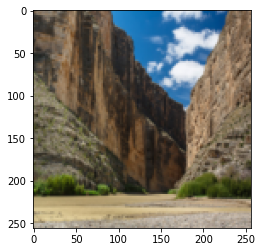

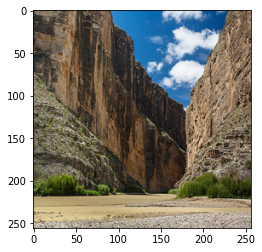

In [ ]:
inp , re = load(PATH+'train/003.png')
# casting to int for matplotlib to show the image

plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

In [ ]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image =  tf.image.resize(real_image, [height, width],
                                method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  return input_image, real_image

In [ ]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis = 0)
  cropped_image = tf.image.random_crop(
      stacked_image, size = [2, IMG_HEIGHT, IMG_WIDTH,3])
  return cropped_image[0], cropped_image[1]

In [ ]:
# Normalizing the images to [-1 , 1]

def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1
  return input_image, real_image

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):

  # Resizing to 286 * 286 * 3
  input_image, real_image  = resize(input_image, real_image, 286, 286)

  # Randomly Cropping to 256 * 256* 3
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random Mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)
  return input_image, real_image


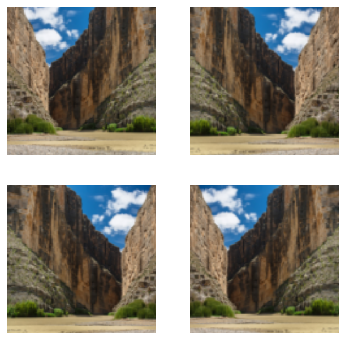

In [ ]:
plt.figure(figsize = (6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i+1)
  plt.imshow(rj_inp/255.0)
  plt.axis('off')
plt.show()

In [ ]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

## **INPUT PIPELINE**

In [ ]:
train_dataset = tf.data.Dataset.list_files(PATH+'train/*.png')
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls = tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
train_dataset

<BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>

In [ ]:
test_dataset = tf.data.Dataset.list_files(PATH+'test/*.png')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [ ]:
test_dataset

<BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, None), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, None), dtype=tf.float32, name=None))>

# **Build the GENERATOR**



*   The architecture of generator is a modified U-NET
*   Each block in the encoder is (Conv --> BatchNormalization --> Leaky ReLU)
*   Each block in the decoder is (Transposed Conv --> Batch Normalization --> Dropout(Applied to the first 3 blocks) --> ReLu)
*    There a re skip connections between the encoder and decoder (as in U-NET).





In [ ]:
OUTPUT_CHANNELS = 3

In [ ]:
def downsample(fliters, size, apply_batchnorm = True):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(3, size, strides = 2 , padding = 'same',
                                      kernel_initializer = initializer, use_bias = False))
  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())
    result.add(tf.keras.layers.LeakyReLU())
  return result

In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print(down_result.shape)

(1, 128, 128, 3)


In [ ]:
def upsample(filters, size, apply_dropout = False):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2DTranspose(filters, size, strides = 2,
                                      padding='same',
                                      kernel_initializer = initializer,
                                      use_bias = False))
  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())
  return result

In [ ]:
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 256, 256, 3)


In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3])

  down_stack = [
      downsample(64, 4, apply_batchnorm=False),
      downsample(128, 4),
      downsample(256, 4),
      downsample(512, 4),
      downsample(512, 4),
      downsample(512, 4),
      downsample(512, 4),
      downsample(512, 4),
  ]
  up_stack = [
      upsample(512, 4, apply_dropout=True),
      upsample(512, 4, apply_dropout=True),
      upsample(512, 4, apply_dropout=True),
      upsample(512, 4),
      upsample(256, 4),
      upsample(128, 4),
      upsample(64, 4),
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS,
                                         4,
                                         strides = 2,
                                         padding = 'same',
                                         kernel_initializer = initializer,
                                         activation = 'tanh')
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)
  
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections

  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])
  
  x = last(x)

  return tf.keras.Model(inputs = inputs,
                        outputs = x)



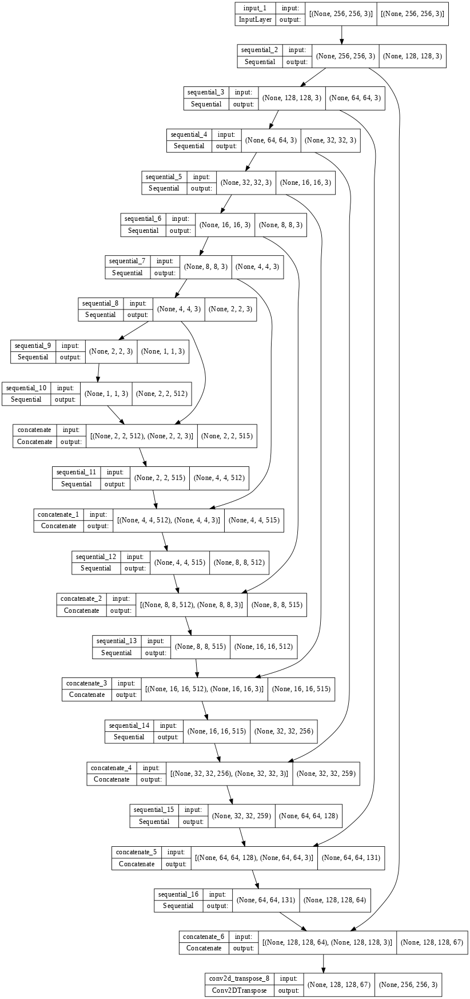

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, 
                          show_shapes=True,
                          dpi = 64)

In [ ]:
#gen_output = generator(inp[tf.newaxis,...]. 
#                       training = False)
#plt.imshow(gen_output[0,...])

# **Generator Loss**


*   It is a sigmoid cross entropy loss of the generated images and an array of ones.
*   L1 Loss which is MAE (Mean Absolute Error) Between the generated image and the target image.
*   This allows the generated image to become structurally similar to the target image
*    The Formula to calculate the total generator loss = gan_loss + LAMBDA * L1_loss, where LAMBDA = 100



The Training Procedue for the generator is shown below:

In [ ]:
LAMBDA = 100

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean Absolute Error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

# **Build the Discriminator**

*   The Discriminator is a PatchGAN
*   Each block in the discriminator is (Conv -> BatchNormalization -> Leaky ReLU)
*   The shape of the output after the lasy layer is (batch_size, 30, 30, 1)
*   Each 30 * 30 patch of the output classifies a 70 * 70 portion of the input image(such an architecture is called a PatchGAN).
*   Discriminator receives 2 inputs.
    *    Input image and the target image, which it should classify as real.
    *    Input image and the generated image (output of generator), which it should classify as fake.
    *    We concatenate these 2 inputs together in the code(tf.concat([inp, tar], axis = -1))


In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256,256,3], name = 'input_image')
  tar = tf.keras.layers.Input(shape=[256,256,3], name = 'target_image')
  x = tf.keras.layers.concatenate([inp, tar])
  down1 = downsample(64, 4, False)(x)
  down2 = downsample(128, 4)(down1)
  down3 = downsample(256, 4)(down2)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)

  conv = tf.keras.layers.Conv2D(512, 4, strides = 1,
                                kernel_initializer = initializer,
                                use_bias = False)(zero_pad1)
                                
  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)

  last = tf.keras.layers.Conv2D(1, 4, strides = 1, kernel_initializer = initializer )(zero_pad2)

  return tf.keras.Model(inputs=[inp,tar], outputs = last) 
   

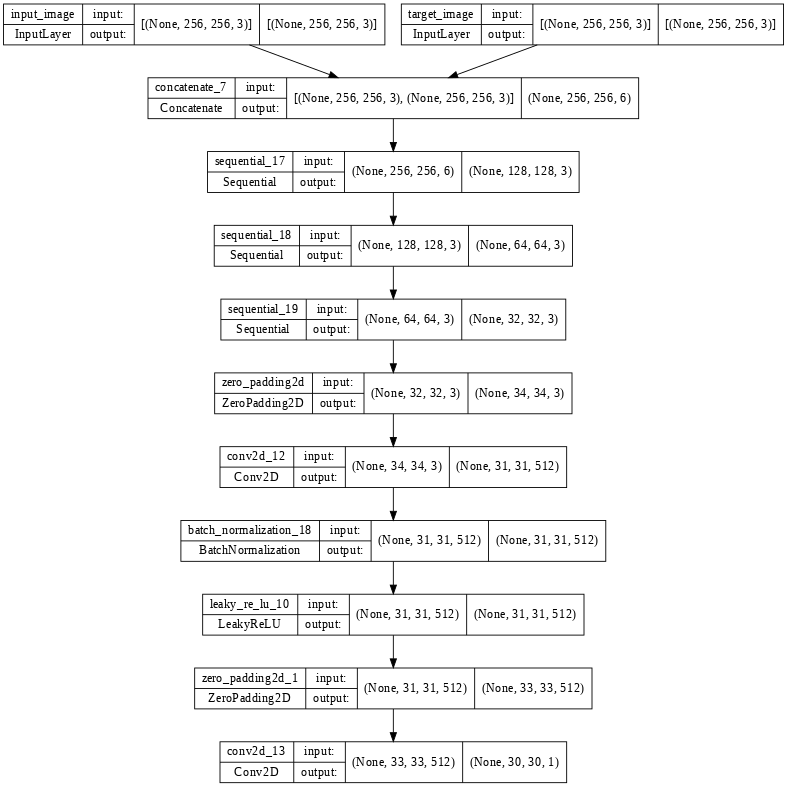

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator,
                          show_shapes = True,
                          dpi = 64)

# **Discriminator Loss**

* The discriminator loss function takes 2 inputs; real images, generated images
* real_loss is a sigmoid cross entropy loss of the real images and an array of ones(since these are the real images)
* generated_loss is a sigmoid cross entropy loss of the generated images and an array of zeros(since these are the fake images)
* Then the total_loss is the sum of the real_loss and the generated loss

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

# **Define the Optimizers and Checkpoint-saver**

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1= 0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/DeepImagify/image-restoration/checkpoints/'
checkpoint_prefix = os.path.join(checkpoint_dir,"ckpt")

checkpoint = tf.train.Checkpoint(generator_optimizer = generator_optimizer,
                                 discriminator_optimizer = discriminator_optimizer,
                                 generator = generator,
                                 discriminator = discriminator)

In [ ]:
checkpoint_dir

'/content/drive/MyDrive/DeepImagify/image-restoration/checkpoints/'

# **Generate Images**

Writing a function to plot some images during training.

* We pass images from the test dataset to the generator
* The generator will then translate the input image into the output
* Last step is to plot the predictions and Voila!!!!!!!!!!!!!!!

Note: THe training  = True is intentional here sence we wamnt the batch statistics while running the model on the test dataset. If we use training = False, we will get the accumulated statistics learned from the training dataset(which we don't want)

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training= True)
  plt.figure(figsize = (15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values between [0 , 1] to plot it
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

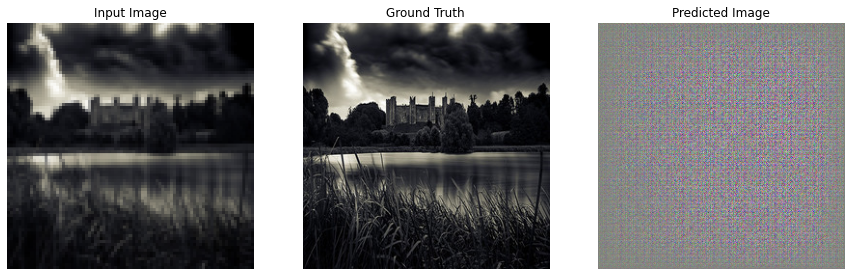

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

# **Training**

* For each example inpit generate an output.
* The discriminator receives the inpit_image and the gernated image as the first input. The second input is the input_image and the target_image.
* Next, we calculate the generator and the discriminator loss.
* Then, we calculate the gradients of loss with respect to both the generator and the discriminator variables (inputs) and apply those to the optimizer.
* Then log the losses to TensorBoard

In [ ]:
EPOCHS = 25

In [ ]:
import datetime
log_dir = "logs/"

summary_writer = tf.summary.create_file_writer(
    log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training = True)

    disc_real_output = discriminator([input_image, target], training = True)
    disc_generated_output = discriminator([input_image, gen_output], training=  True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)

    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)


  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)
  
  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
  
  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step = epoch)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step = epoch)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step = epoch)
    tf.summary.scalar('disc_loss', disc_loss, step = epoch)

The Actual Training loop:


*   Iterates over the number of epochs
*   On each epoch it clears the display and runs the generate_images to show it's progress
*   On each epocj it iterates over the training datset, printing a '.' for each example.
* It saves a checkpoint every 20 epochs



In [ ]:
def fit(train_ds, epochs, test_ds):
  for epoch in range(epochs):
    start = time.time()
    display.clear_output(wait=True)

    for example_input, example_target in test_ds.take(1):
      generate_images(generator, example_input, example_target)
    print("Epoch: ", epoch)

    # Train
    for n, (input_image, target) in train_ds.enumerate():
      print('.', end='')
      if(n+1) % 100 == 0:
        print()
      train_step(input_image, target, epoch)
    print()

      # Save the checkpoint the model for every 5 epochs
    if(epoch + 1) % 5 == 0 :
      checkpoint.save(file_prefix = checkpoint_prefix)
      
    print("Time taken for epoch{} is {} sec\n".format(epoch + 1,
                                                        time.time()-start))
  checkpoint.save(file_prefix=checkpoint_prefix)


In [ ]:
# docs_infra: no execute
%reload_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

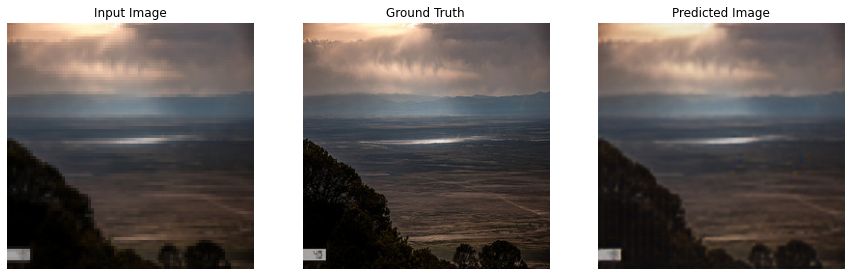

Epoch:  24
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

In [ ]:
fit(train_dataset, EPOCHS, test_dataset)

In [ ]:
!ls {checkpoint_dir}

checkpoint		    ckpt-5.index
ckpt-1.data-00000-of-00001  ckpt-6.data-00000-of-00001
ckpt-1.index		    ckpt-6.index
ckpt-2.data-00000-of-00001  ckpt-7.data-00000-of-00001
ckpt-2.index		    ckpt-7.index
ckpt-3.data-00000-of-00001  ckpt-8.data-00000-of-00001
ckpt-3.index		    ckpt-8.index
ckpt-4.data-00000-of-00001  ckpt-9.data-00000-of-00001
ckpt-4.index		    ckpt-9.index
ckpt-5.data-00000-of-00001


In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

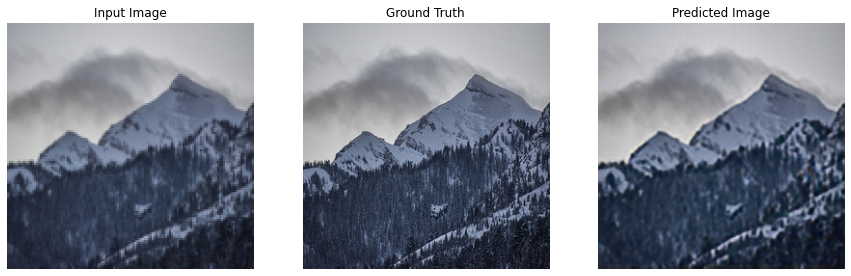

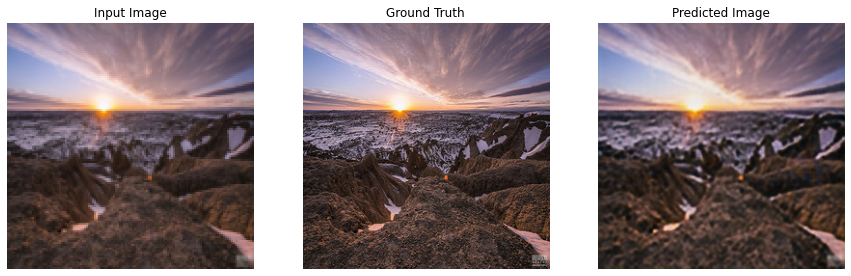

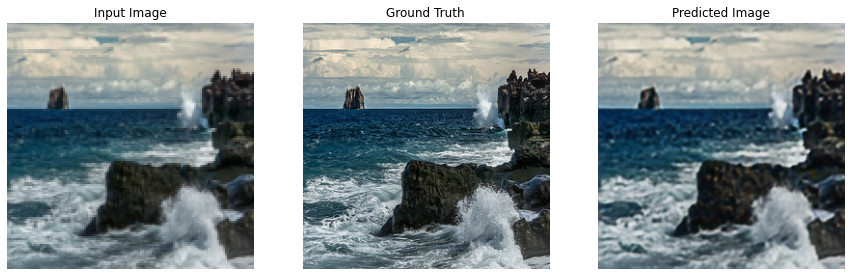

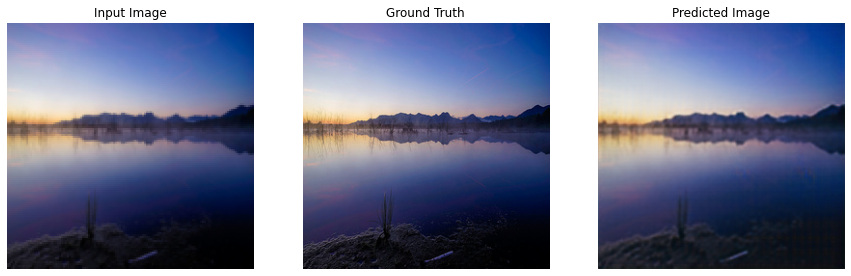

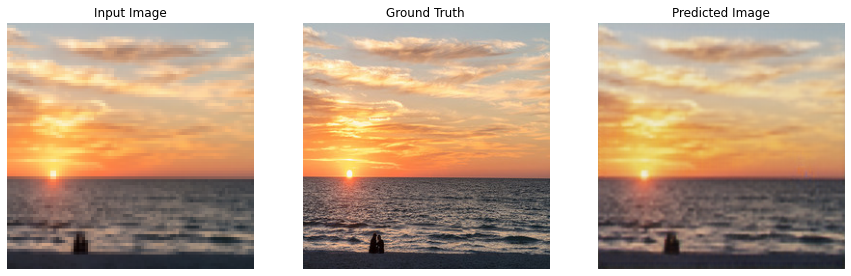

In [ ]:
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

In [ ]:
@tf.function(input_signature=[tf.TensorSpec([None, 256, 256, 3], dtype = tf.float32)])
def model_predict1(input_batch):
  return {'outputs': generator(input_batch, training = True)}

@tf.function(input_signature=[tf.TensorSpec([None, 256, 256, 3], dtype = tf.float32)])
def model_predict2(input_batch):
  return {'outputs': generator(input_batch, training = False)}

In [ ]:
generator.save('/content/drive/MyDrive/DeepImagify/image-restoration/image_restoration.h5')

In [ ]:
!pip install tensorflowjs

     |████████████████████████████████| 77 kB 4.1 MB/s 
     |████████████████████████████████| 462 kB 22.0 MB/s 


In [ ]:
!tensorflowjs_converter --input_format = keras /content/drive/MyDrive/DeepImagify/image-restoration/image_restoration.h5 /content/drive/MyDrive/DeepImagify/image-restoration/image_restorationjs

usage: TensorFlow.js model converters. [-h]
                                       [--input_format {tf_hub,keras_saved_model,tfjs_layers_model,tf_saved_model,keras,tf_frozen_model}]
                                       [--output_format {tfjs_layers_model,keras_saved_model,keras,tfjs_graph_model}]
                                       [--signature_name SIGNATURE_NAME]
                                       [--saved_model_tags SAVED_MODEL_TAGS]
                                       [--quantize_float16 [QUANTIZE_FLOAT16]]
                                       [--quantize_uint8 [QUANTIZE_UINT8]]
                                       [--quantize_uint16 [QUANTIZE_UINT16]]
                                       [--quantization_bytes {1,2}]
                                       [--split_weights_by_layer] [--version]
                                       [--skip_op_check]
                                       [--strip_debug_ops STRIP_DEBUG_OPS]
                                       [-

In [ ]:
!cp -rf image_restorationjs /content/drive/MyDrive/DeepImagify/image-restoration

cp: cannot stat 'image_restorationjs': No such file or directory


# **Load Model**

In [ ]:
image_rest_model = tf.keras.models.load_model('/content/drive/MyDrive/DeepImagify/image-restoration/image_restoration.h5', compile = False)

In [ ]:
image_rest_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential_2 (Sequential)      (None, 128, 128, 3)  144         ['input_1[0][0]']                
                                                                                                  
 sequential_3 (Sequential)      (None, 64, 64, 3)    156         ['sequential_2[0][0]']           
                                                                                                  
 sequential_4 (Sequential)      (None, 32, 32, 3)    156         ['sequential_3[0][0]']       

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot (5).png to Screenshot (5).png


In [ ]:
image = tf.io.read_file('Screenshot (5).png')
image = tf.image.decode_png(image, channels = 3)
image = tf.image.resize(image, [256, 256],
                        method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
image = tf.cast(image, tf.float32)
image = (image / 127.5) - 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


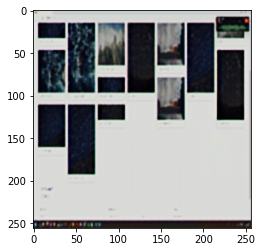

In [ ]:
prediction = image_rest_model(tf.expand_dims(image, 0 ), training = True)
img_2 = plt.imshow(prediction[0] * 0.5 + 0.55)

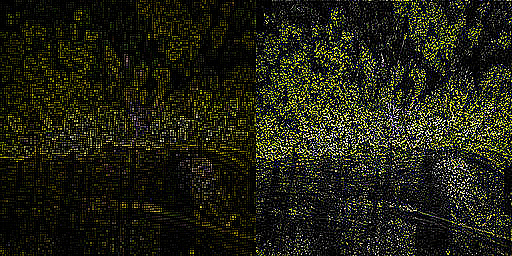

-1

In [ ]:
import cv2
import numpy as np
import os
os.environ['OPENCV_IO_MAX_IMAGE_PIXELS']=str(2**64)
# import cv2 
from google.colab.patches import cv2_imshow

#image = cv2.imread('005002.png')
sharpen_kernel = np.array([[-1,-1,-1], [-1,8,-1], [-1,-1,-1]])
sharpen = cv2.filter2D(img_2, -1, sharpen_kernel)

cv2_imshow(sharpen)
cv2.waitKey()